<a href="https://colab.research.google.com/github/simulate111/Data-Science_2024/blob/main/mini_project_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Upload files from local drive
#from google.colab import files
#uploaded = files.upload()

In [2]:
import matplotlib.pyplot as plt
import networkx as nx
!git clone https://github.com/simulate111/Data-Science_2024.git
import pandas as pd
%cd Data-Science_2024
from networkx.algorithms.community import greedy_modularity_communities

Cloning into 'Data-Science_2024'...
remote: Enumerating objects: 119, done.
remote: Counting objects: 100% (119/119), done.
remote: Compressing objects: 100% (116/116), done.
remote: Total 119 (delta 33), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (119/119), 11.82 MiB | 12.14 MiB/s, done.
Resolving deltas: 100% (33/33), done.
/content/Data-Science_2024


In [3]:
#Read data and make dataframe using Pandas dataframe
artists = pd.read_csv('artists.csv')
relationships = pd.read_csv('relationships.csv')
institutions = pd.read_csv('institutions.csv')
schools = pd.read_csv('schools.csv')

print(artists.isnull().sum())
print(relationships.isnull().sum())
print(institutions.isnull().sum())
print(schools.isnull().sum())
print(artists.describe())
print(relationships.describe())
print(institutions.describe())
print(schools.describe())

artistUrl           0
id                  0
image               0
nation             32
title               0
totalWorksTitle     0
year                1
dtype: int64
artistUrl           0
friends          2580
influenced_by    2512
influenced_on    2637
institution      2362
movements          40
school           1966
type                1
dtype: int64
city       2
country    2
title      0
url        0
dtype: int64
title    0
url      0
dtype: int64
                            artistUrl                        id  \
count                            2996                      2996   
unique                           2996                      2996   
top     /en/ancient-egyptian-painting  5d230b31edc2c9fb74ae130a   
freq                                1                         1   

                                                    image    nation  \
count                                                2996      2964   
unique                                               2996       10

In [4]:
# Remove "/en/" from the beginning of each input
artists['artistUrl'] = artists['artistUrl'].str.replace('/en/', '', regex=False)
relationships['artistUrl'] = relationships['artistUrl'].str.replace('/en/', '', regex=False)
relationships['friends'] = relationships['friends'].str.replace('/en/', '', regex=False)
relationships['influenced_by'] = relationships['influenced_by'].str.replace('/en/', '', regex=False)
relationships['influenced_on'] = relationships['influenced_on'].str.replace('/en/', '', regex=False)
relationships['institution'] = relationships['institution'].str.replace('/en/', '', regex=False)
relationships['school'] = relationships['school'].str.replace('/en/', '', regex=False)
print("\nUpdated artists dataset:")
print(artists.head())
print("\nUpdated relationships dataset:")
print(relationships.head())


Updated artists dataset:
                   artistUrl                        id  \
0  ancient-egyptian-painting  5d230b31edc2c9fb74ae130a   
1      ancient-greek-pottery  5ced09b1edc2c993247c1ea0   
2     ancient-greek-painting  5ce3c54dedc2c921c4035b7d   
3                    apelles  5ba232ccedc2c918cc654ea8   
4             fayum-portrait  5beea1ededc2c915a01acdda   

                                               image     nation  \
0  https://uploads2.wikiart.org/00244/images/anci...  Egyptians   
1  https://uploads7.wikiart.org/00238/images/anci...     Greeks   
2  https://uploads8.wikiart.org/00237/images/anci...     Greeks   
3  https://uploads2.wikiart.org/00202/images/apel...      Greek   
4  https://uploads7.wikiart.org/00210/images//01....  Egyptians   

                                  title totalWorksTitle                  year  
0                         Ancient Egypt    169 artworks  c.3150 BC - c.640 AD  
1                 Ancient Greek Pottery     87 artworks       

In [5]:
# Handle missing values
artists = artists.assign(nation=artists['nation'].fillna('Unknown'))
artists = artists.assign(year=artists['year'].fillna('Unknown'))
relationships = relationships.assign(friends=relationships['friends'].fillna(''))
relationships = relationships.assign(influenced_by=relationships['influenced_by'].fillna(''))
relationships = relationships.assign(influenced_on=relationships['influenced_on'].fillna(''))
relationships = relationships.assign(institution=relationships['institution'].fillna(''))
relationships = relationships.assign(movements=relationships['movements'].fillna(''))
relationships = relationships.assign(school=relationships['school'].fillna(''))
institutions = institutions.assign(city=institutions['city'].fillna('Unknown'))
institutions = institutions.assign(country=institutions['country'].fillna('Unknown'))
print(artists.isnull().sum())
print(relationships.isnull().sum())
print(institutions.isnull().sum())
print(schools.isnull().sum())

artistUrl          0
id                 0
image              0
nation             0
title              0
totalWorksTitle    0
year               0
dtype: int64
artistUrl        0
friends          0
influenced_by    0
influenced_on    0
institution      0
movements        0
school           0
type             1
dtype: int64
city       0
country    0
title      0
url        0
dtype: int64
title    0
url      0
dtype: int64


In [6]:
# Make graph
G = nx.DiGraph()
for index, row in relationships.iterrows():
    artist = row['artistUrl']
    friends = row['friends'].split(',')
    influenced_by = row['influenced_by'].split(',')
    influenced = row['influenced_on'].split(',')
    G.add_node(artist, type='artist')
    for friend in friends:
        if friend:
            G.add_edge(artist, friend, relationship='friend')
    for influence in influenced_by:
        if influence:
            G.add_edge(influence, artist, relationship='influenced_by')
    for influence in influenced:
        if influence:
            G.add_edge(artist, influence, relationship='influenced')

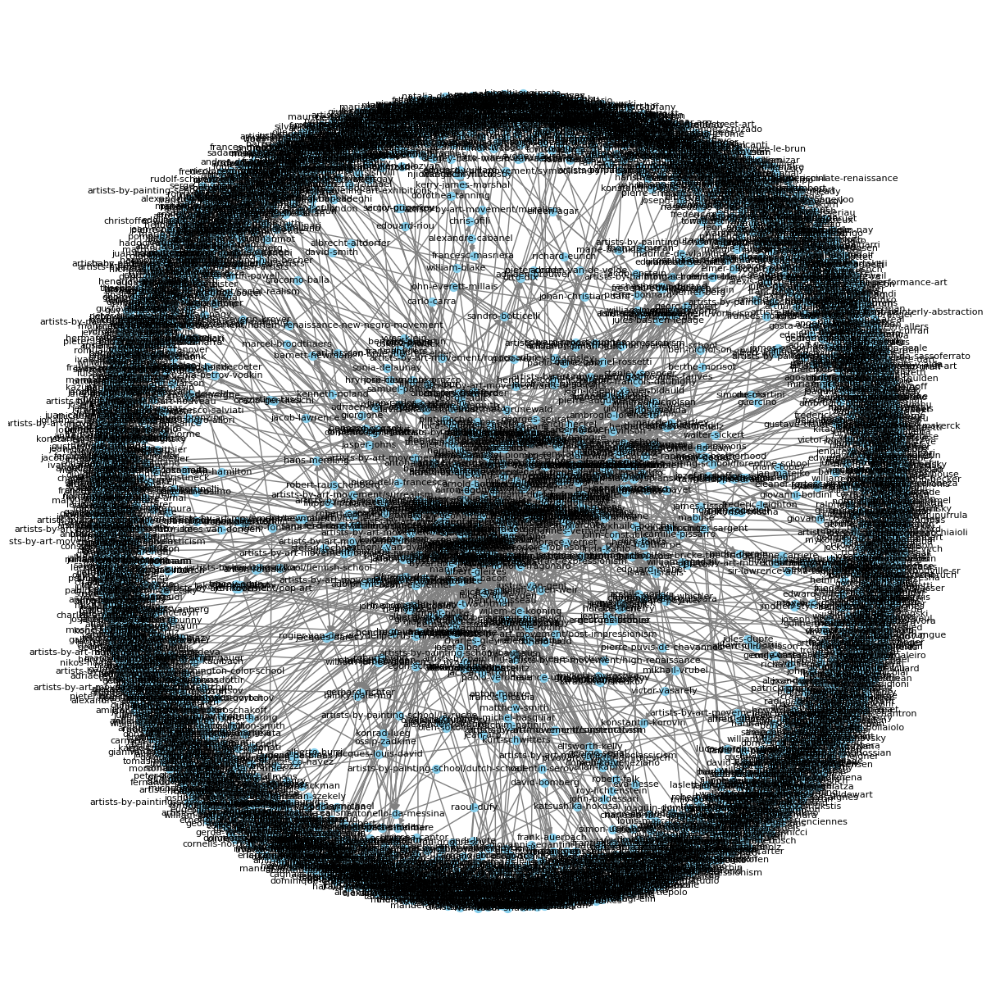

In [7]:
# Visualize
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_size=50, node_color="skyblue", font_size=8, font_color="black", edge_color="gray")

In [8]:
# Centrality measures
degree_centrality = nx.degree_centrality(G)
#betweenness_centrality = nx.betweenness_centrality(G)
#closeness_centrality = nx.closeness_centrality(G)
communities = greedy_modularity_communities(G)

In [9]:
# 1. Most influential artists (based on degree centrality)
most_influential_artists = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Most Influential Artists:")
for artist in most_influential_artists:
    print(artist)

Most Influential Artists:
('pablo-picasso', 0.019340519974635383)
('amedeo-modigliani', 0.012365250475586557)
('paul-gauguin', 0.011414077362079899)
('pierre-auguste-renoir', 0.011414077362079899)
('jackson-pollock', 0.011414077362079899)
('andy-warhol', 0.01046290424857324)
('claude-monet', 0.010145846544071021)
('paul-cezanne', 0.009828788839568801)
('edouard-manet', 0.009511731135066582)
('robert-delaunay', 0.008877615726062143)


In [10]:
# 2. Most influential movements (based on frequency in relationships dataset)
movements_count = relationships['movements'].value_counts()
most_influential_movements = movements_count.head(10)
print("Most Influential Movements:", most_influential_movements)

Most Influential Movements: movements
Romanticism                 177
Impressionism               120
Realism                     104
Expressionism                96
Baroque                      86
Surrealism                   78
Post-Impressionism           67
Contemporary                 56
Abstract Expressionism       49
Baroque,Dutch Golden Age     48
Name: count, dtype: int64


In [11]:
# 3. Most influential institutions (based on frequency in relationships dataset)
institutions_count = relationships['institution'].value_counts()
most_influential_institutions = institutions_count.head(10)
print("Most Influential Institutions:", most_influential_institutions)

Most Influential Institutions: institution
                                                                               2362
artists-by-art-institution/cole-des-beaux-arts                                   52
artists-by-art-institution/guild-of-saint-luke                                   30
artists-by-art-institution/imperial-academy-of-arts-saint-petersburg-russia      27
artists-by-art-institution/royal-academy-of                                      25
artists-by-art-institution/acad-mie-julian                                       19
artists-by-art-institution/art-students-league                                   18
artists-by-art-institution/self-taught                                           17
artists-by-art-institution/national-academy-of-visual-arts-and-architecture      17
artists-by-art-institution/kunstakademie-dusseldorf-dusseldorf-germany           16
Name: count, dtype: int64


In [12]:
# 4. Nationalities with the majority of artists
nationalities = artists['nation'].value_counts()
print("Nationalities with the Majority of Artists:", nationalities.head(10))

Nationalities with the Majority of Artists: nation
American    520
French      402
Italian     269
British     249
German      160
Russian     108
Dutch       105
Spanish      87
Romanian     78
Japanese     67
Name: count, dtype: int64


In [13]:
# 5. Biggest communities
biggest_communities = sorted(communities, key=len, reverse=True)[:5]
biggest_communities_list = [list(community) for community in biggest_communities]
print("Biggest Communities in the Network:")
for i, community in enumerate(biggest_communities_list):
    print(f"\n Community {i+1}:")
    for member in community[:5]:
        print(member)

Biggest Communities in the Network:

 Community 1:
walter-sickert
jacques-emile-blanche
francisco-de-zurbaran
lorenzo-lotto
frans-francken-the-younger

 Community 2:
arnold-bocklin
maruja-mallo
artists-by-art-movement/high-renaissance
artists-by-art-movement/regionalism
daan-lemaire

 Community 3:
victor-brauner
juan-gris
andr-lhote
artists-by-art-movement/native-art
moise-kisling

 Community 4:
paul-klee
ilya-bolotowsky
marc-chagall
olexandr-archipenko
richard-hamilton

 Community 5:
paul-signac
andres-de-santa-maria
juan-bautista-maino
theodore-rousseau
lisa-yuskavage


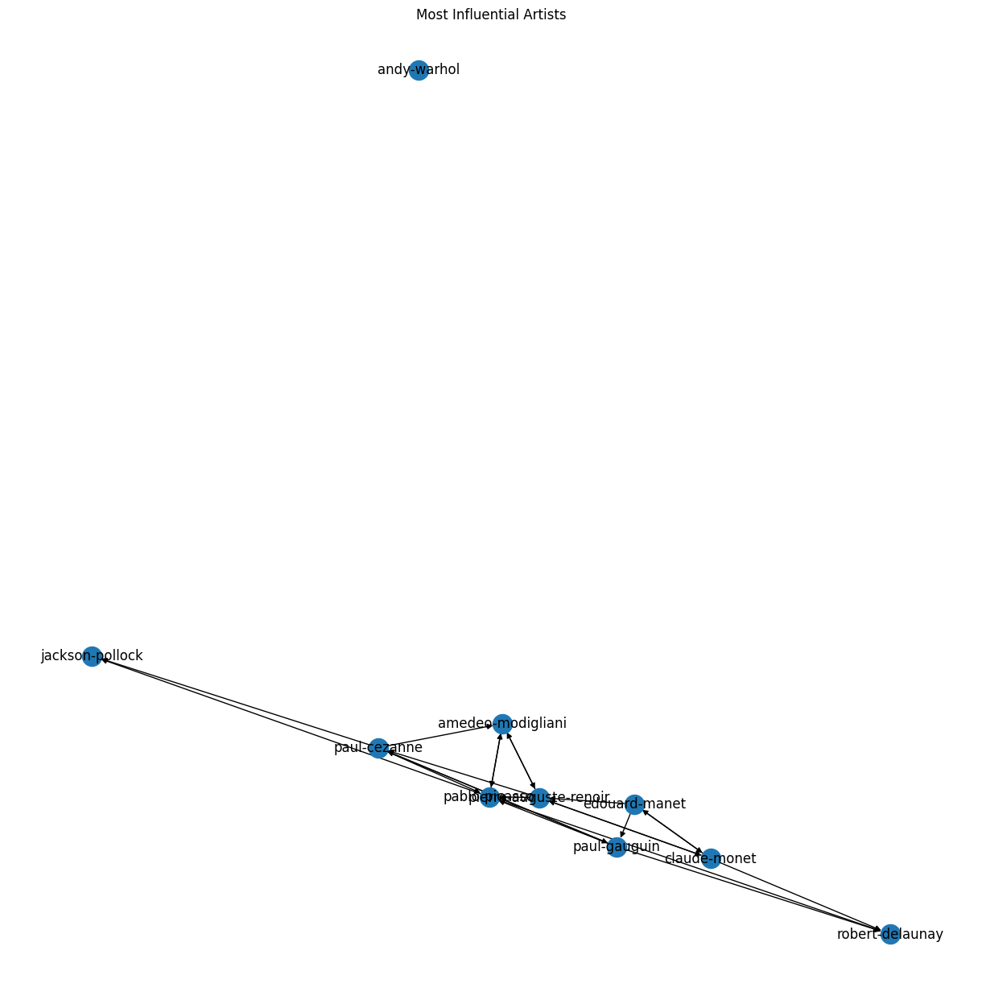

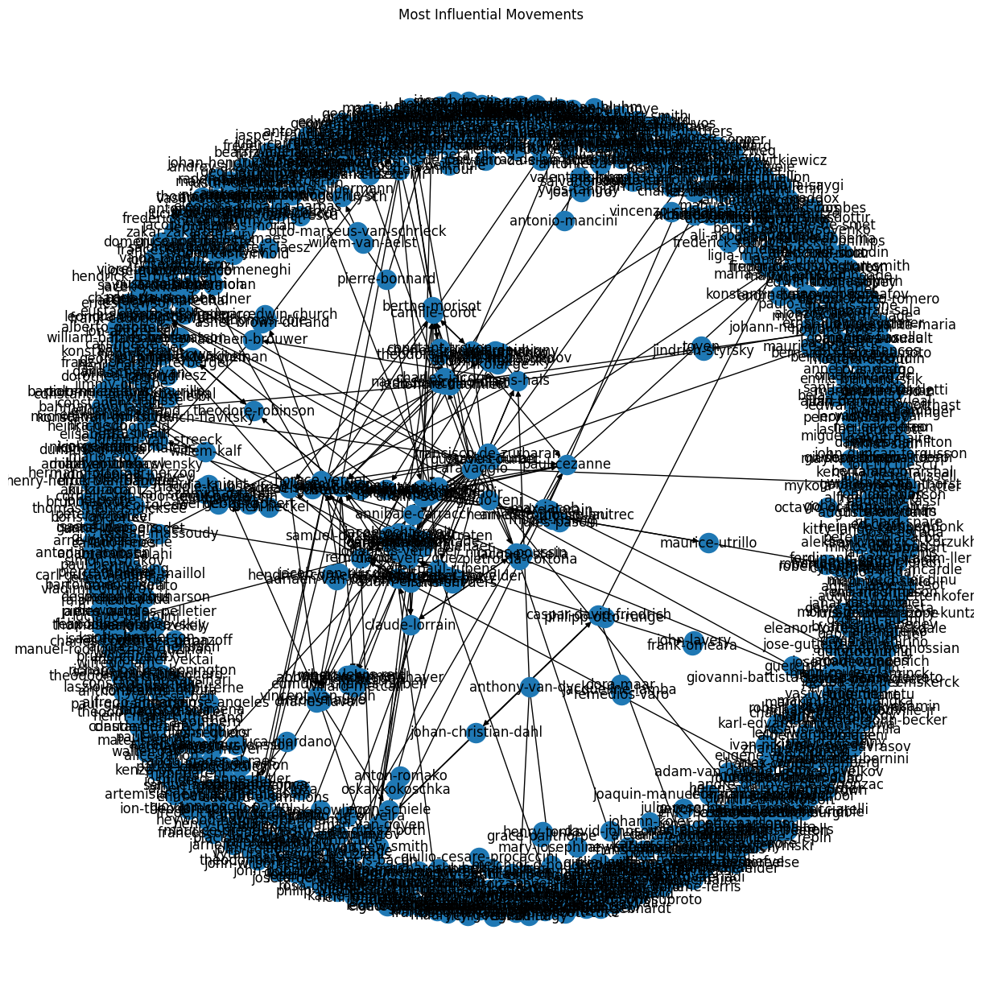

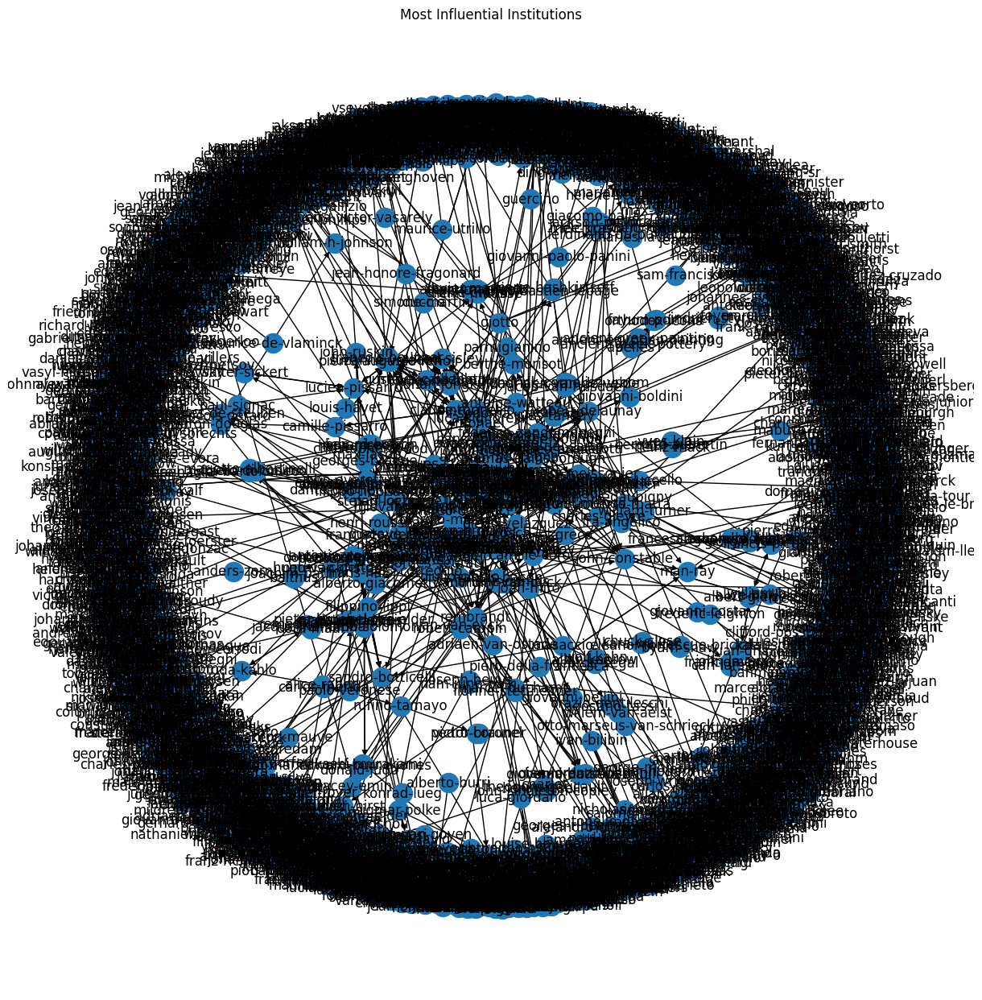

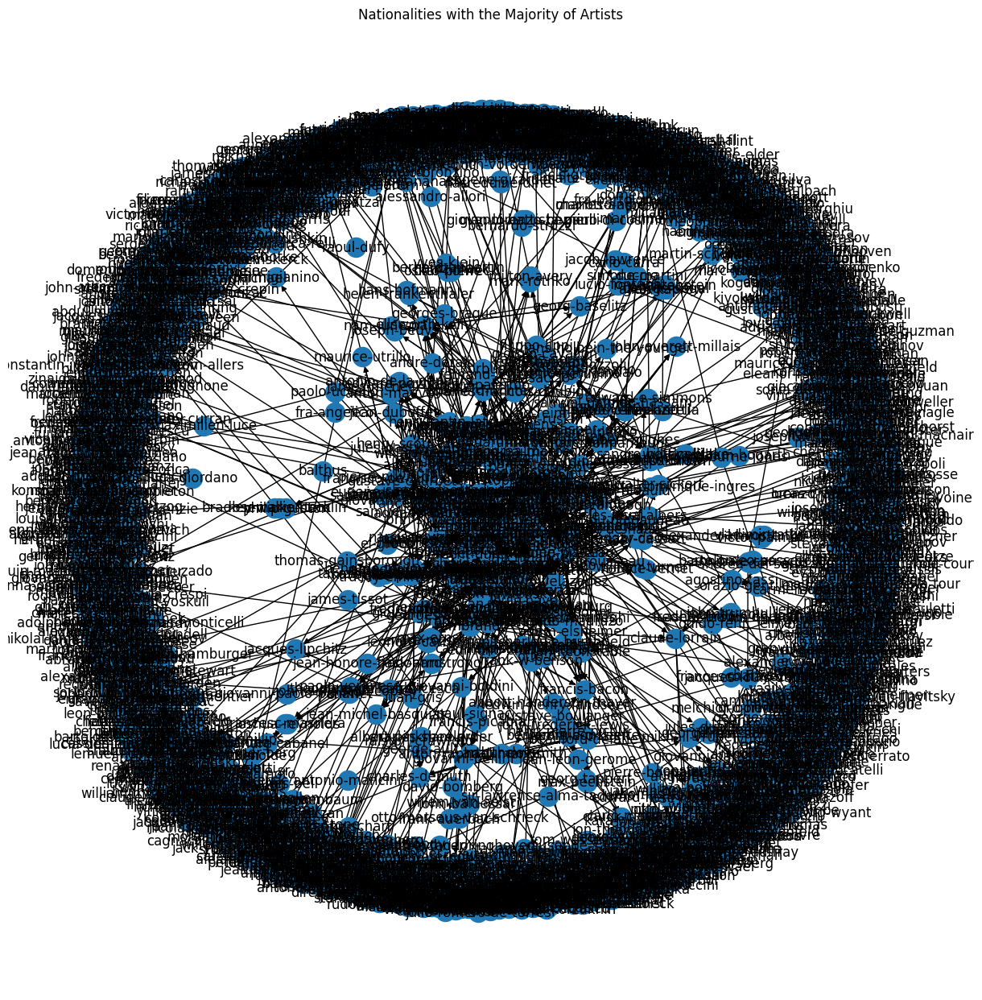

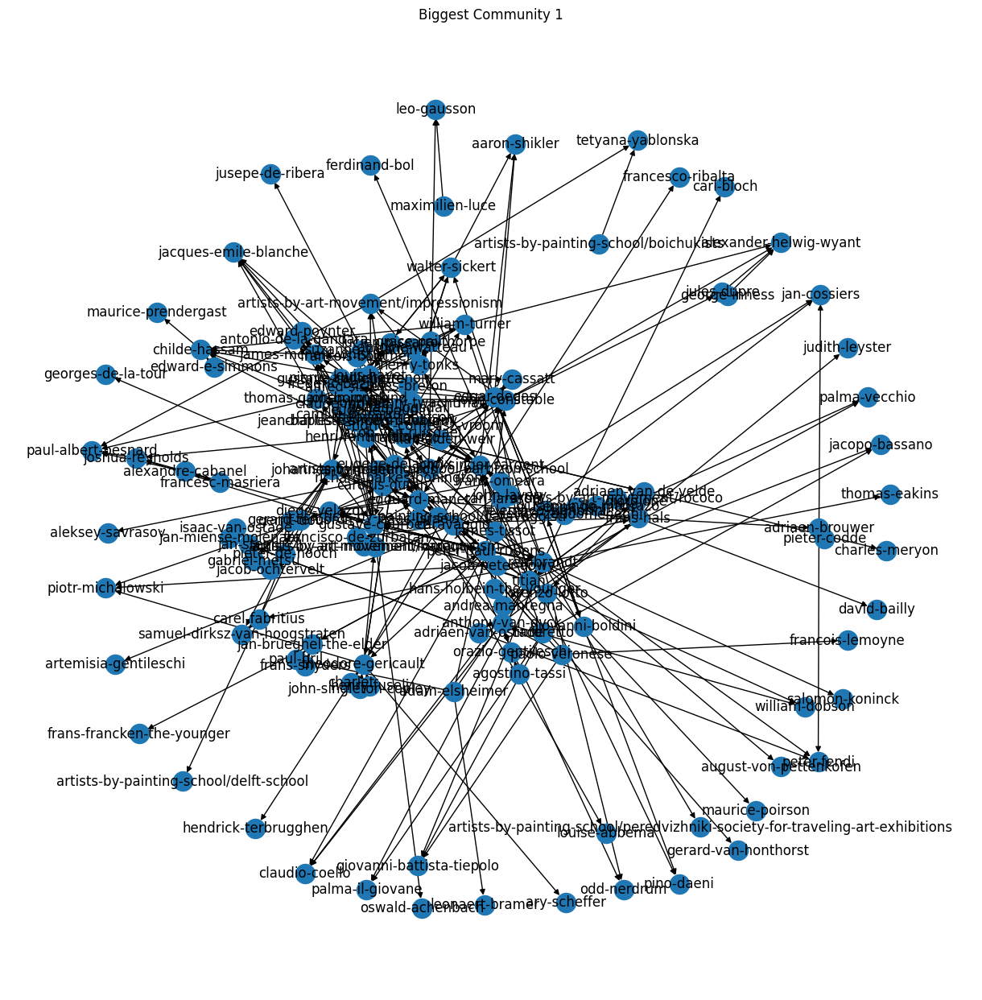

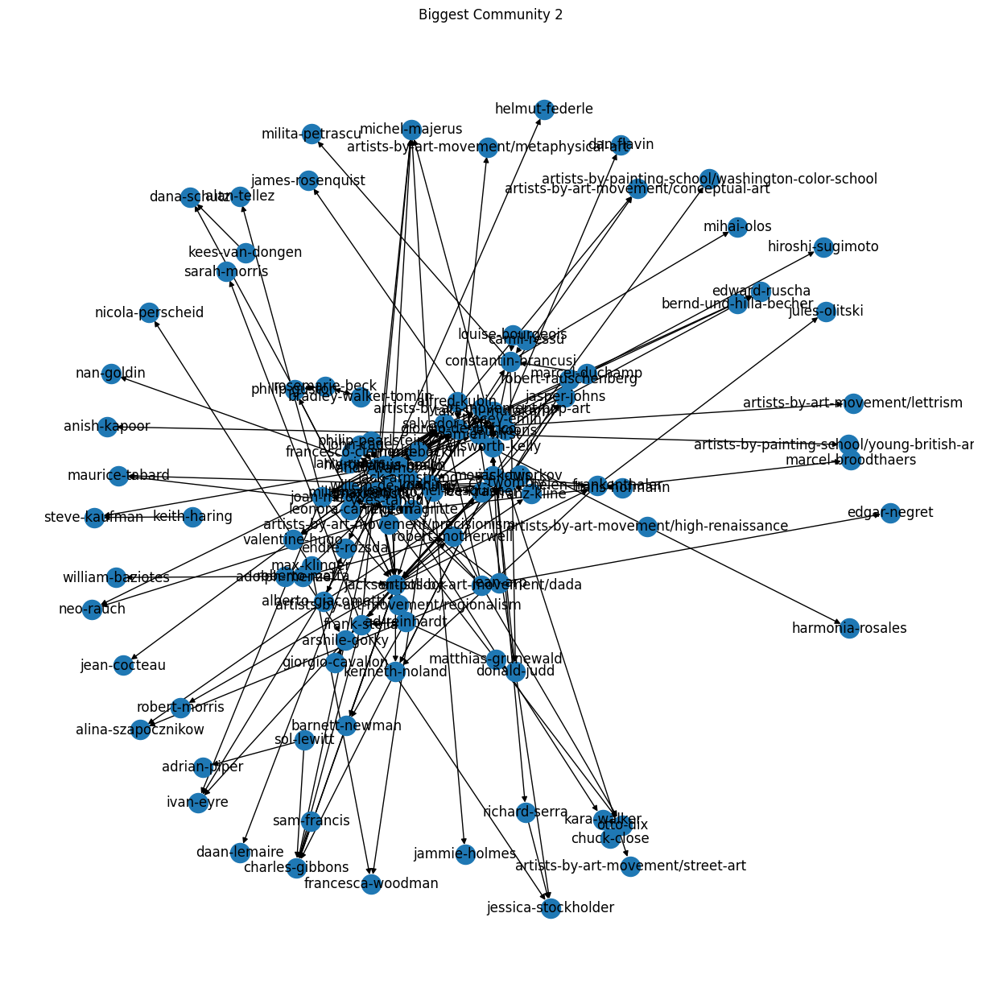

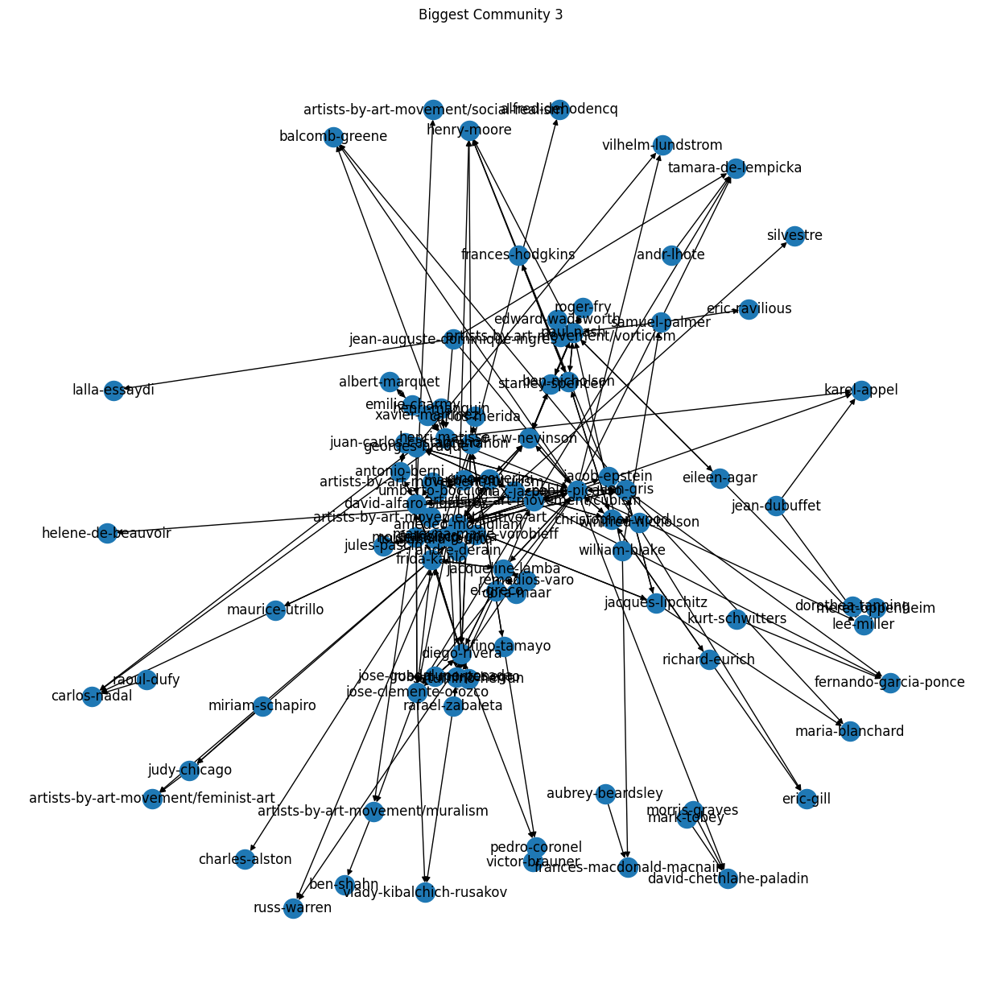

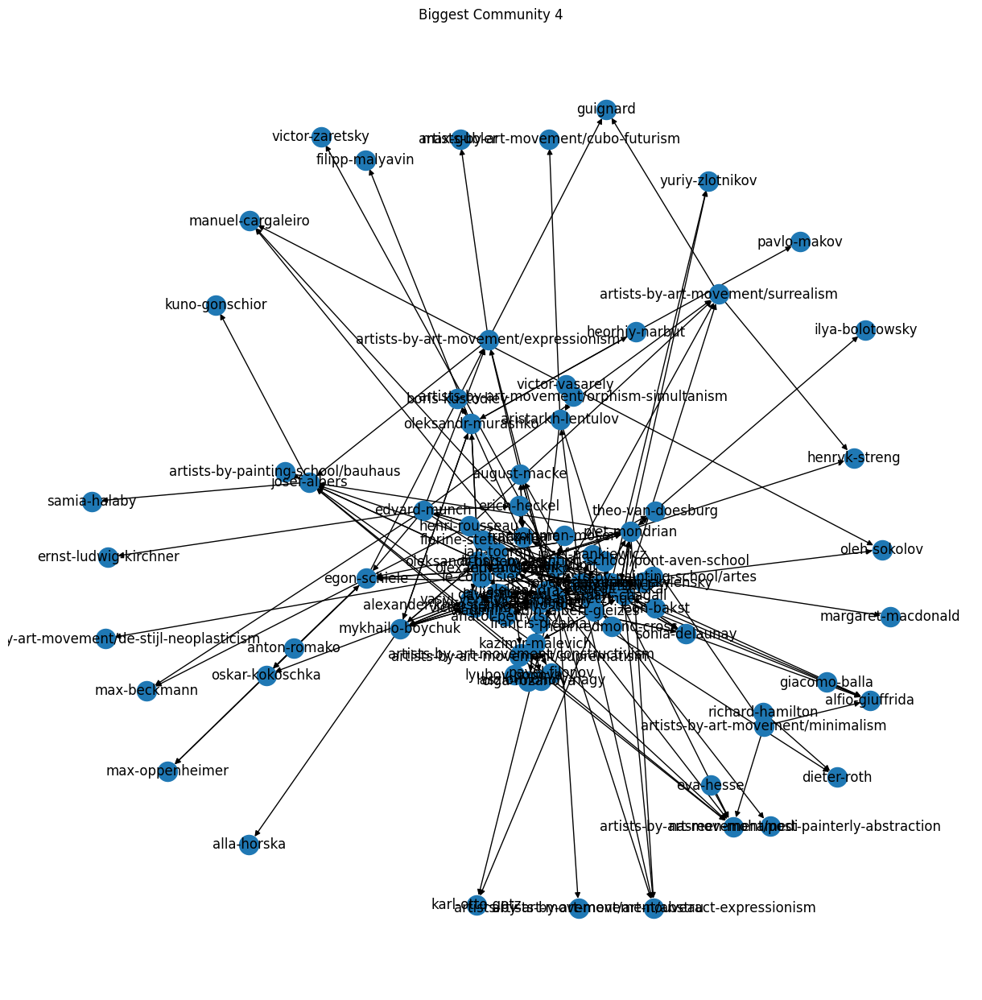

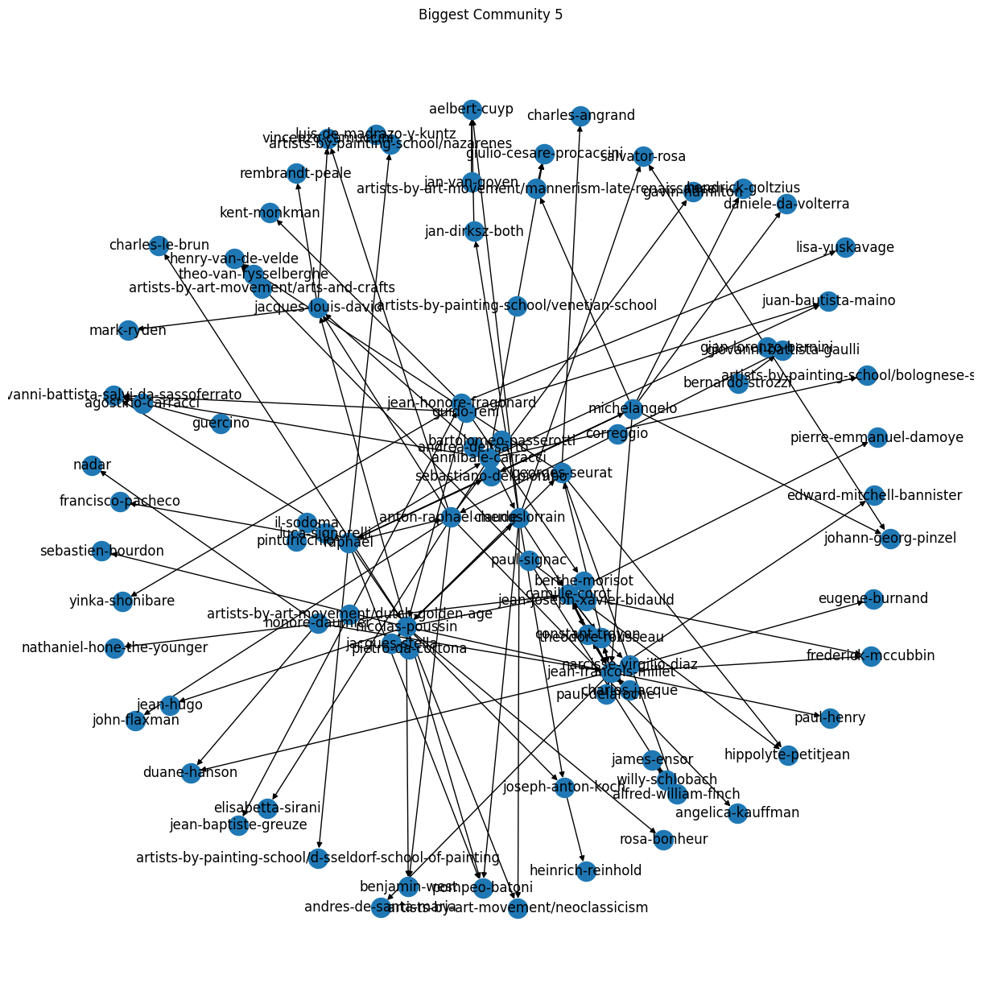

In [14]:
# Make network for each of the questions
def visualize_subgraph(nodes, title):
    subgraph = G.subgraph(nodes)
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True)
    plt.title(title)
    plt.show()
most_influential_artists_nodes = [artist for artist, _ in most_influential_artists]
visualize_subgraph(most_influential_artists_nodes, "Most Influential Artists")

most_influential_movements_nodes = relationships[relationships['movements'].isin(most_influential_movements.index)]['artistUrl'].unique()
visualize_subgraph(most_influential_movements_nodes, "Most Influential Movements")

most_influential_institutions_nodes = relationships[relationships['institution'].isin(most_influential_institutions.index)]['artistUrl'].unique()
visualize_subgraph(most_influential_institutions_nodes, "Most Influential Institutions")

majority_nationalities_nodes = artists[artists['nation'].isin(nationalities.head(10).index)]['artistUrl'].unique()
visualize_subgraph(majority_nationalities_nodes, "Nationalities with the Majority of Artists")

for i, community in enumerate(biggest_communities_list):
    visualize_subgraph(community, f"Biggest Community {i+1}")